## Anaylsis Defect

In [1]:
import os
import warnings
import random
from pprint import pprint
import copy
from typing import List, Tuple
import glob
import json
import csv
# import dataclasses
from joblib import Parallel, delayed
from typing import List, Set, Dict, Any

from tqdm import tqdm
import numpy as np
import pandas as pd
from box import Box, from_file
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from scipy.optimize import minimize
from sklearn.metrics import jaccard_score
import cv2
import seaborn as sns

In [2]:
class CFG(object):
    # basic
    debug: bool = False
    debug_sample: int = 64
    folds: int  = 4
    seed: int   = 417
    eps: float  = 1e-12
    
    # data
    PATH_CSV: str  =  f'../data/002_Full+California/002_seed417.csv'
    PATH_DATA = '../data/002_Full+California/'
    
    percentiles = [1, 99]
    
    outdir = 'output/analysis/'
    
# box
cfg = Box({k:v for k, v in dict(vars(CFG)).items() if '__' not in k})
    
# 乱数のシードを設定
np.random.seed(cfg.seed)
random.seed(cfg.seed)
    
pprint(cfg)

{'PATH_CSV': '../data/002_Full+California/002_seed417.csv',
 'PATH_DATA': '../data/002_Full+California/',
 'debug': False,
 'debug_sample': 64,
 'eps': 1e-12,
 'folds': 4,
 'outdir': 'output/analysis/',
 'percentiles': BoxList([1, 99]),
 'seed': 417}


In [3]:
df = pd.read_csv(cfg.PATH_CSV)
df.sample(4)

,name,feature,mask,defects,fold,hight,width,california,cv
371,d38ad371-6c7b-4780-8f9f-e503d784f2ed_108,../data/002_Full+California/img/d38ad371-6c7b-...,../data/002_Full+California/ann/d38ad371-6c7b-...,False,-1,512,512,True,0
1960,fde53a49-77c7-48de-85cc-d4633c5c705b_1,../data/002_Full+California/img/fde53a49-77c7-...,../data/002_Full+California/ann/fde53a49-77c7-...,True,0,512,512,False,0
452,d38ad371-6c7b-4780-8f9f-e503d784f2ed_75,../data/002_Full+California/img/d38ad371-6c7b-...,../data/002_Full+California/ann/d38ad371-6c7b-...,False,-1,512,512,True,0
1767,a253b245-bb18-4657-8797-6809b754bf52_0,../data/002_Full+California/img/a253b245-bb18-...,../data/002_Full+California/ann/a253b245-bb18-...,False,1,512,512,False,0


## Test Visualize

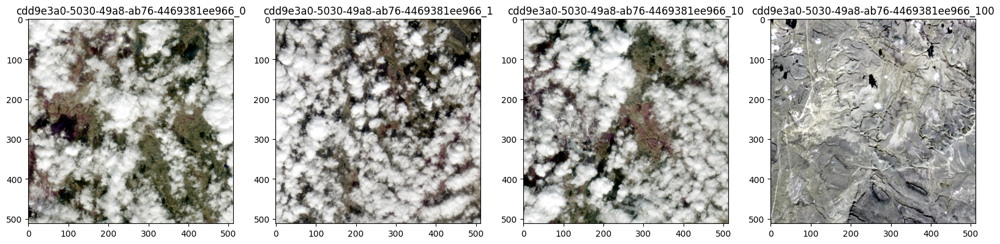

In [4]:
NUM_SAMPLE = 4
df_sample = df.head(NUM_SAMPLE)

plt.figure(figsize=(20, 20), facecolor='white')
for it, (idx, row) in enumerate(df_sample.iterrows()):
    img = np.load(row.feature)

    true_color = np.log(img[:, :, 2:5] + 1)

    for ch in range(3):
        im = true_color[:, :, ch]
        top, bottom = np.percentile(im, max(cfg.percentiles)), np.percentile(im, min(cfg.percentiles))
        im = np.clip(true_color[:, :, ch], a_min=bottom, a_max=top)
        true_color[:, :, ch] = (im - bottom) / (top - bottom)
        
    true_color = (true_color * 255).astype(np.uint8)[:,:, ::-1]
    
    plt.subplot(4, 4, it+1)
    plt.title(row['name'])
    plt.imshow(true_color)
    
    # plt.axis('off')
plt.savefig(os.path.join(cfg.outdir, f'011_true-color_tiles.png'))
plt.show();

## Statistics

<Axes: xlabel='california', ylabel='defects'>

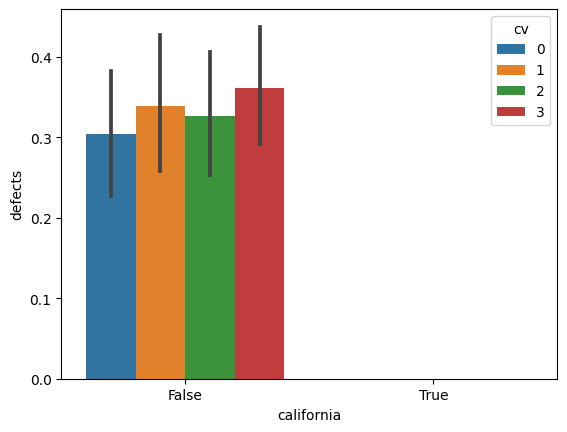

In [5]:
sns.barplot(data=df, x="california", y="defects", hue="cv")

<Axes: xlabel='fold', ylabel='defects'>

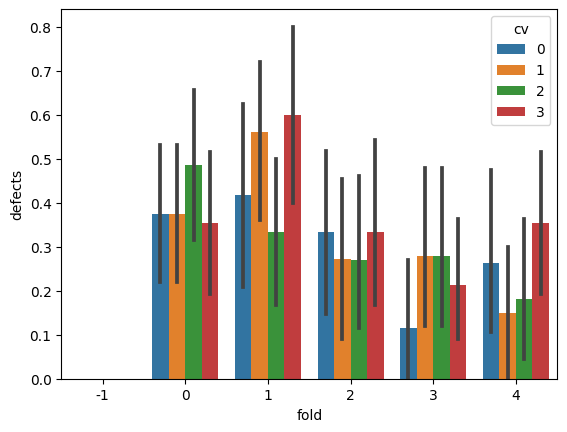

In [6]:
sns.barplot(data=df, x="fold", y="defects", hue="cv")

## Normal vizualization

In [29]:
df_norm = df[df['defects'] == False]
COUNT_RUN = 0

df_norm.head(4)

,name,feature,mask,defects,fold,hight,width,california,cv
0,cdd9e3a0-5030-49a8-ab76-4469381ee966_0,../data/002_Full+California/img/cdd9e3a0-5030-...,../data/002_Full+California/ann/cdd9e3a0-5030-...,False,-1,512,512,True,0
1,cdd9e3a0-5030-49a8-ab76-4469381ee966_1,../data/002_Full+California/img/cdd9e3a0-5030-...,../data/002_Full+California/ann/cdd9e3a0-5030-...,False,-1,512,512,True,3
2,cdd9e3a0-5030-49a8-ab76-4469381ee966_10,../data/002_Full+California/img/cdd9e3a0-5030-...,../data/002_Full+California/ann/cdd9e3a0-5030-...,False,-1,512,512,True,0
3,cdd9e3a0-5030-49a8-ab76-4469381ee966_100,../data/002_Full+California/img/cdd9e3a0-5030-...,../data/002_Full+California/ann/cdd9e3a0-5030-...,False,-1,512,512,True,1


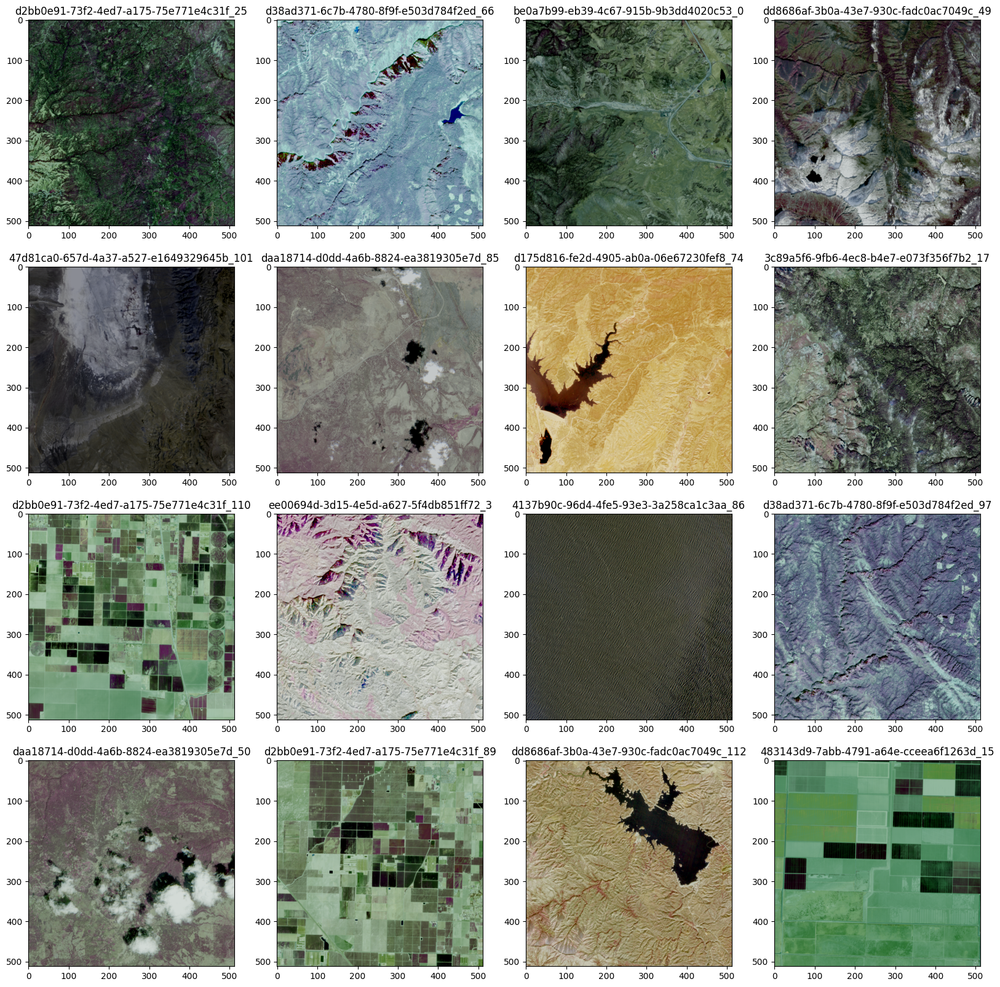

In [45]:
NUM_SAMPLE = 16
df_sample = df_norm.sample(NUM_SAMPLE)
COUNT_RUN += 1

plt.figure(figsize=(20, 20), facecolor='white')
for it, (idx, row) in enumerate(df_sample.iterrows()):
    img = np.load(row.feature)

    true_color = np.log(img[:, :, 2:5] + 1)

    for ch in range(3):
        im = true_color[:, :, ch]
        top, bottom = np.percentile(im, max(cfg.percentiles)), np.percentile(im, min(cfg.percentiles))
        im = np.clip(true_color[:, :, ch], a_min=bottom, a_max=top)
        true_color[:, :, ch] = (im - bottom) / (top - bottom + 1)
        
    true_color = (true_color * 255).astype(np.uint8)[:, :, ::-1]
    
    plt.subplot(4, 4, it+1)
    plt.title(row['name'])
    plt.imshow(true_color)
    
    # plt.axis('off')
plt.savefig(os.path.join(cfg.outdir, f'011_true-color_norm-no-defect_tiles_C{COUNT_RUN}.png'))
plt.show();

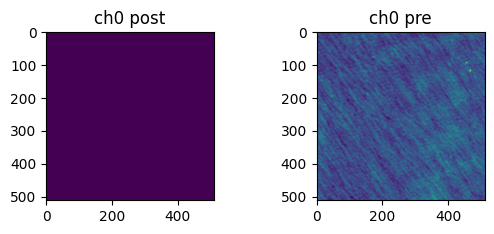

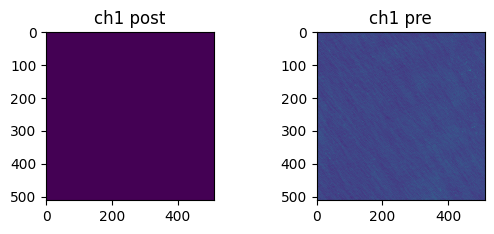

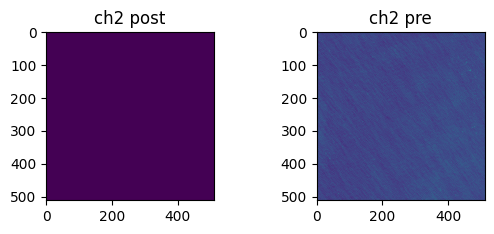

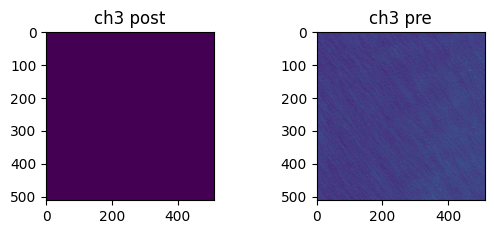

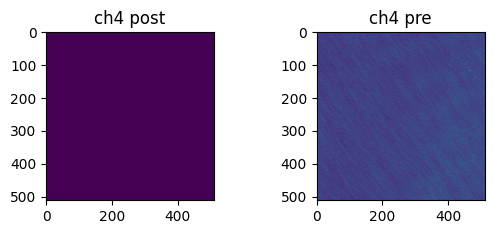

...

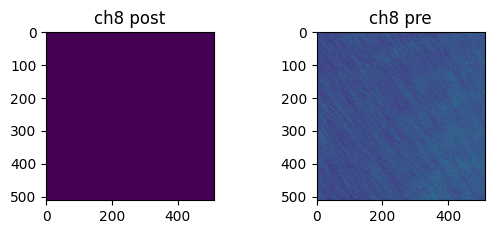

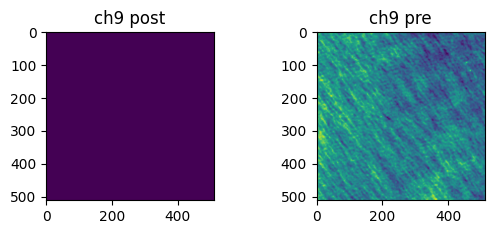

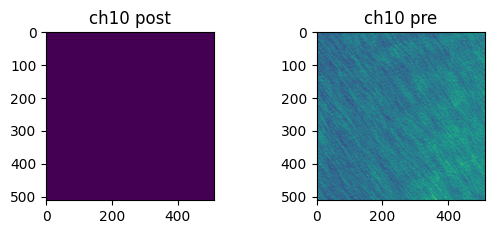

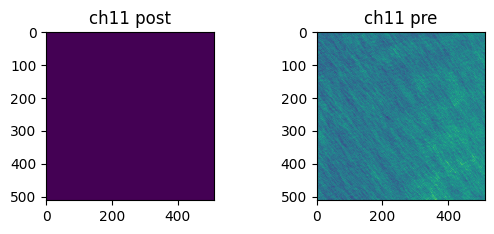

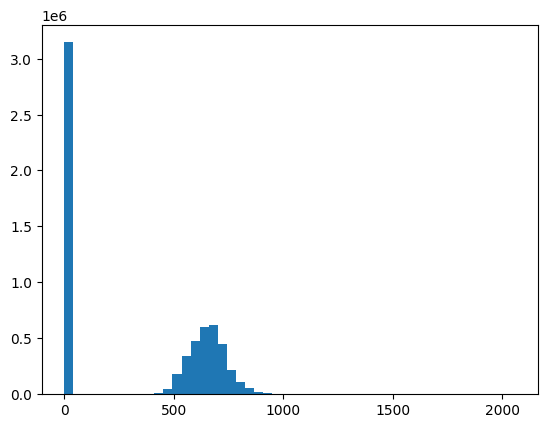

In [42]:
PATH_ANO = '../data/002_Full+California/img/4137b90c-96d4-4fe5-93e3-3a258ca1c3aa_39.npy'

img = np.load(PATH_ANO)

for i in range(12):
    plt.figure()
    
    plt.subplot(2, 2, 1)
    plt.title(f'ch{i} post')
    plt.imshow(img[:, :, i])
    
    plt.subplot(2, 2, 2)
    plt.title(f'ch{i} pre')
    plt.imshow(img[:, :, i+12])

plt.show();

plt.figure()
plt.hist(img.flatten(), bins=50)
plt.show();

plt.clf()
plt.close()

## `Defect` vizualization

In [17]:
df_defect = df[df['defects'] == True]
COUNT_RUN = 0
df_defect.head(3)

,name,feature,mask,defects,fold,hight,width,california,cv
1442,05cfef86-3e27-42be-a0cb-a61fe2f89e40_0,../data/002_Full+California/img/05cfef86-3e27-...,../data/002_Full+California/ann/05cfef86-3e27-...,True,1,512,512,False,1
1443,06181a53-1181-427c-9f60-55040bde0a9a_0,../data/002_Full+California/img/06181a53-1181-...,../data/002_Full+California/ann/06181a53-1181-...,True,0,512,512,False,0
1444,06181a53-1181-427c-9f60-55040bde0a9a_1,../data/002_Full+California/img/06181a53-1181-...,../data/002_Full+California/ann/06181a53-1181-...,True,0,512,512,False,2


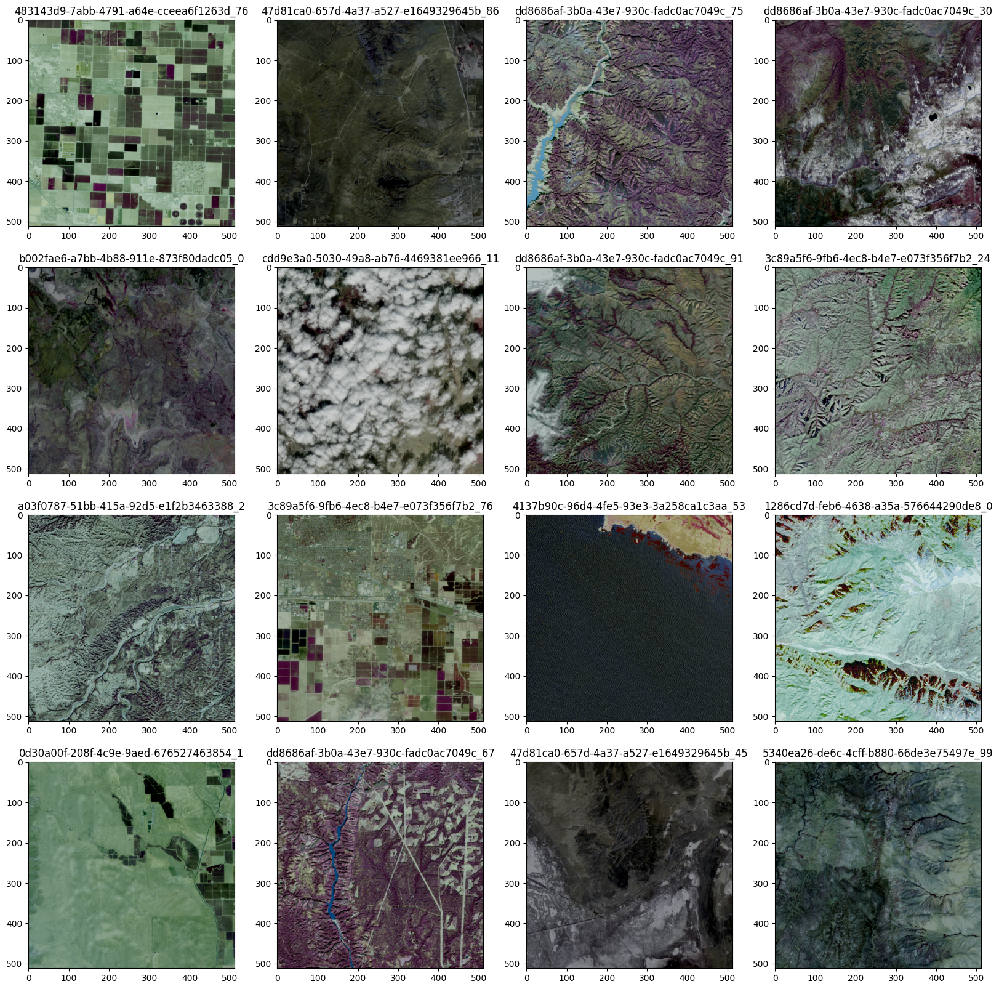

In [28]:
NUM_SAMPLE = 16
df_sample = df_norm.sample(NUM_SAMPLE)
COUNT_RUN += 1

plt.figure(figsize=(20, 20), facecolor='white')
for it, (idx, row) in enumerate(df_sample.iterrows()):
    img = np.load(row.feature)

    true_color = np.log(img[:, :, 2:5] + 1)

    for ch in range(3):
        im = true_color[:, :, ch]
        top, bottom = np.percentile(im, max(cfg.percentiles)), np.percentile(im, min(cfg.percentiles))
        im = np.clip(true_color[:, :, ch], a_min=bottom, a_max=top)
        true_color[:, :, ch] = (im - bottom) / (top - bottom + 1)
        
    true_color = (true_color * 255).astype(np.uint8)[:, :, ::-1]
    
    plt.subplot(4, 4, it+1)
    plt.title(row['name'])
    plt.imshow(true_color)
    
    # plt.axis('off')
plt.savefig(os.path.join(cfg.outdir, f'011_true-color_defect_tiles_C{COUNT_RUN}.png'))
plt.show();

### Mask

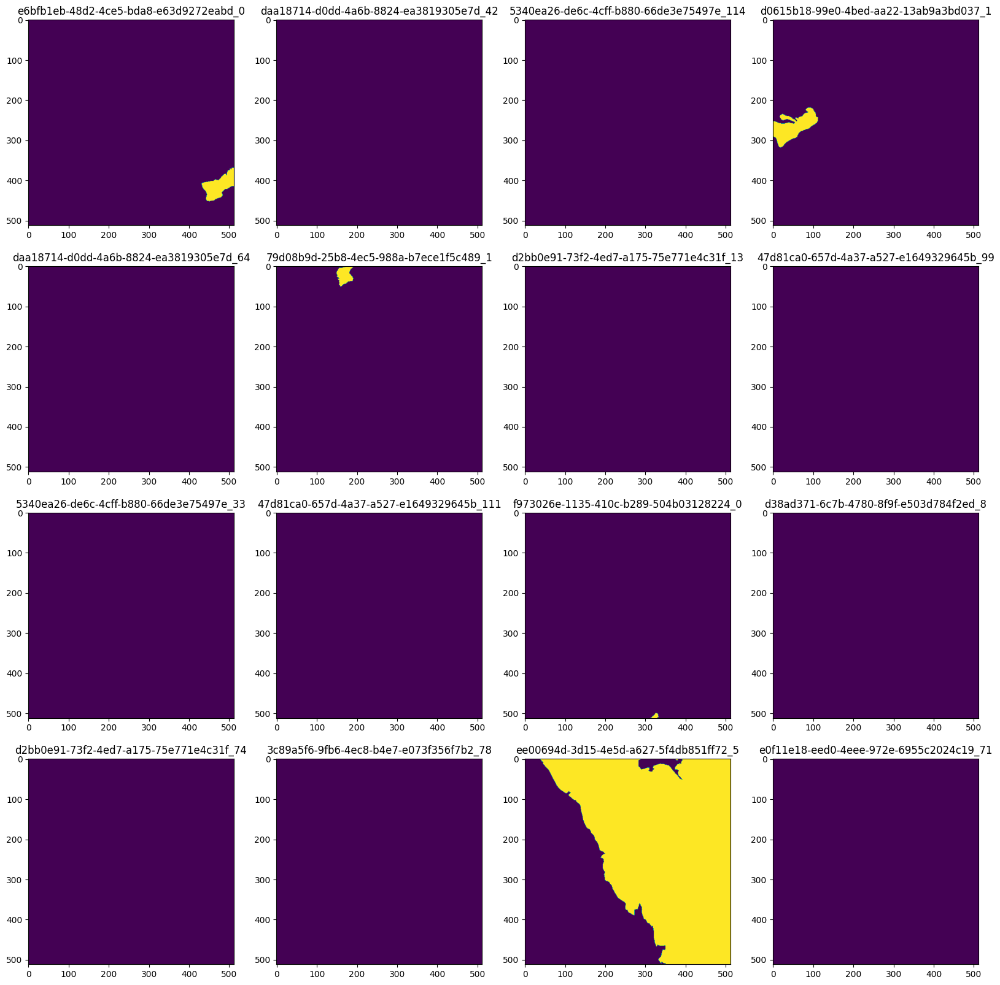

In [22]:
NUM_SAMPLE = 16
df_sample = df_norm.sample(NUM_SAMPLE)
COUNT_RUN += 1

plt.figure(figsize=(20, 20), facecolor='white')
for it, (idx, row) in enumerate(df_sample.iterrows()):
    img = np.load(row['mask'])
    
    plt.subplot(4, 4, it+1)
    plt.title(row['name'])
    plt.imshow(img)
    
    # plt.axis('off')
plt.savefig(os.path.join(cfg.outdir, f'011_mask_defect_tiles_C{COUNT_RUN}.png'))
plt.show();

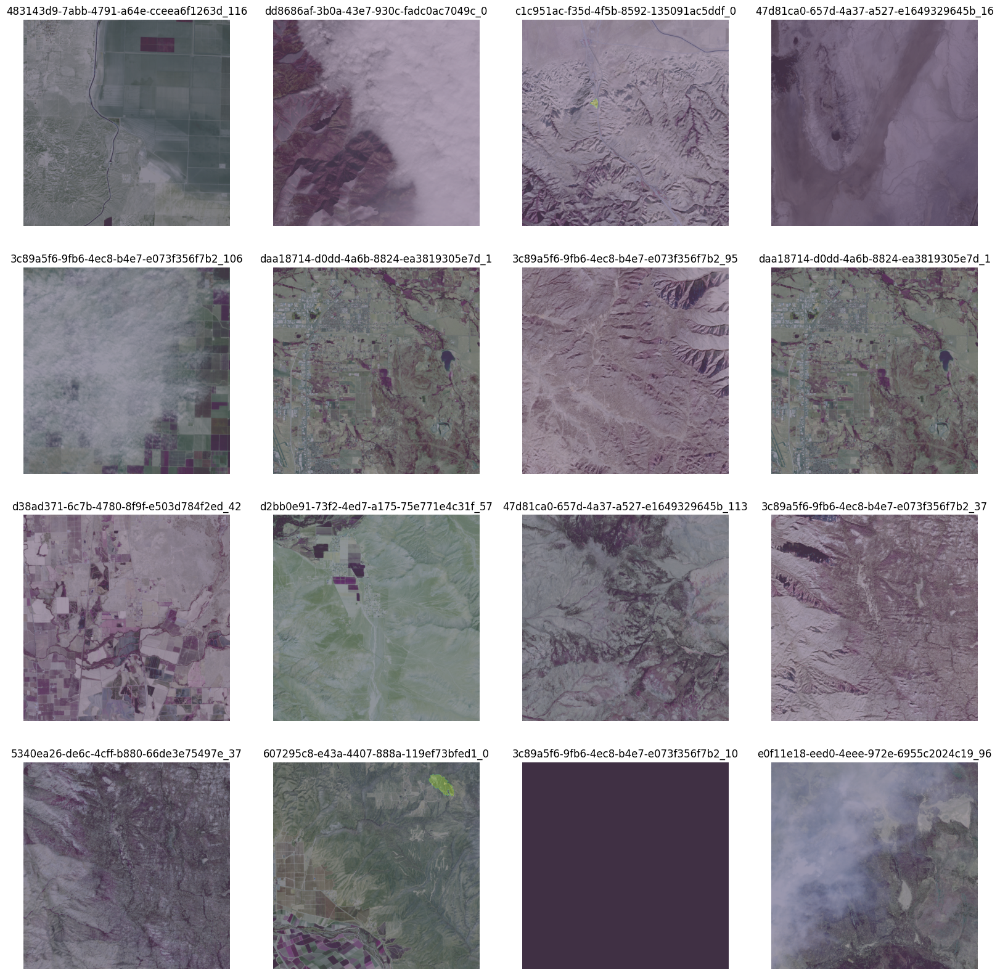

In [27]:
NUM_SAMPLE = 16
df_sample = df_norm.sample(NUM_SAMPLE)
COUNT_RUN += 1

plt.figure(figsize=(20, 20), facecolor='white')
for it, (idx, row) in enumerate(df_sample.iterrows()):
    img = np.load(row.feature)
    mask = np.load(row['mask'])

    true_color = np.log(img[:, :, 2:5] + 1)

    for ch in range(3):
        im = true_color[:, :, ch]
        top, bottom = np.percentile(im, max(cfg.percentiles)), np.percentile(im, min(cfg.percentiles))
        im = np.clip(true_color[:, :, ch], a_min=bottom, a_max=top)
        true_color[:, :, ch] = (im - bottom) / (top - bottom + 1)
        
    true_color = (true_color * 255).astype(np.uint8)[:, :, ::-1]
    
    plt.subplot(4, 4, it+1)
    plt.title(row['name'])
    plt.imshow(true_color, alpha=0.75)
    
    plt.imshow(mask, alpha=0.25)
    
    plt.axis('off')
plt.savefig(os.path.join(cfg.outdir, f'011_set_defect_tiles_C{COUNT_RUN}.png'))
plt.show();